# <center> Exploration 

In this notebook we will focus on exploring and understanding our dataset

# Import

In [1]:
import json
import numpy as np
import pandas as pd

from IPython.display import clear_output
from matplotlib import pyplot as plt
import seaborn as sns

import sklearn
from sklearn.metrics import confusion_matrix
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split

from tensorflow.python.keras.metrics import Metric
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (Conv2D, MaxPooling2D, AveragePooling2D,Flatten,
                                    Dense, Dropout, Activation)


In [2]:
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

# Load file

In [3]:
df = pd.read_json('../data/shipsnet.json')

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   data       4000 non-null   object
 1   labels     4000 non-null   int64 
 2   locations  4000 non-null   object
 3   scene_ids  4000 non-null   object
dtypes: int64(1), object(3)
memory usage: 125.1+ KB


In [5]:
del df['locations']
del df['scene_ids']

In [6]:
df.shape

(4000, 2)

# Knowing more about our data

* ### Mapping of the classes name

In [7]:
classes = {0: 'no_ship', 1: 'ship'}

* ### Classes distribution

d:\perso\workspace\samyoussada\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


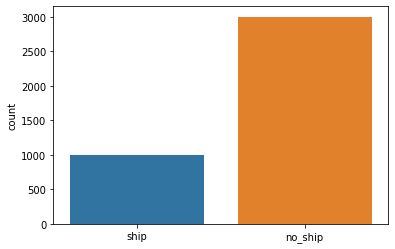

In [8]:
vfunc = np.vectorize(lambda x: classes[x])
sns.countplot(vfunc(df.labels))
plt.show()

The classes are clearly imbalanced. We shoud consider for the model a metrics privileging the positive class (if important to the business case) rather than a standard accuracy. 

__Explanation :__ A dummy classifier predicting everytime 'no_ship' will result in 75% of accuracy. That could beat nostradamus, but in fact that's a bad classifier.

We should consider the score on each class.

We will also see other metrics that could put more empashis on the __"boat"__ class

* #### Images size

In [9]:
df.data.apply(lambda x : len(x)).unique()
#np.unique(list(map(len,X)),return_counts=True) #Numpy Version

array([19200], dtype=int64)

All the images have the same size

In [10]:
import math
math.sqrt(19200/3)

80.0

The images are __RGB images__ : __3 channels__, and a __size of 80 * 80__

# Visualize images

* ### Usefull functions

* * ##### Preprocessing functions

In [11]:
def into_nparray(df_x, column_name):
    def list_into_np_array(pixel_vals):
        return np.array(pixel_vals).astype('uint8')
    df_x[column_name] = df_x[column_name].apply(list_into_np_array)
    return df_x

In [12]:
def re_arange_image(df_x,column_name):
    def arr_reshape(arr):
        return arr.reshape(3, int(19200/3)).T.reshape((80,80,3))
        #return arr.reshape([-1, 3, 80, 80]).transpose([0,2,3,1])
    df_x[column_name] = df_x[column_name].apply(arr_reshape)
    return df_x

* * ##### Image Visualization functions

* * * Function to get the possible dimensions for the plot

In [13]:
def divisorGenerator(n):
    large_divisors = []
    for i in range(1, int(math.sqrt(n) + 1)):
        if n % i == 0:
            yield i
            if i*i != n:
                large_divisors.append(n / i)
    for divisor in reversed(large_divisors):
        yield int(divisor)

* * * Function to find the best dimensions across possibilities

In [14]:
def findMiddle(input_list):
    middle = float(len(input_list))/2
    if len(input_list) % 2 != 0:
        return (input_list[int(middle - .5)],input_list[int(middle - .5)])
    else:
        return (input_list[int(middle)], input_list[int(middle-1)])

* * * ###### The function to show images

In [15]:
#if numpy arrays prefered : delete every ".iloc[i]" and use directly "[i]"
def show_examples(classes, images, labels, nbr_images=25, set_name=''): 
    #Find the best axes dimension for the given number of images
    dim1,dim2 = findMiddle(list(divisorGenerator(nbr_images)))
    
    size = 20
        
    #Set the nbr of images per axes, the figsize, and get the axes
    fig, axes = plt.subplots(dim1,dim2, figsize=(size,size))
    
    for i,ax in enumerate(axes.flat):
        ax.imshow(images.iloc[i])
        ax.set_title(label = classes[labels.iloc[i]]+"_"+str(images.index[i]),
                    fontsize = size/1.3)
    
    plt.suptitle(t = f"{str(nbr_images)} exemples of : {set_name}",
                 fontsize = size,
                 va='top', y =1.0)
    
    plt.tight_layout()
    plt.show()

* * * ###### Function To plot images by batches 

In [16]:
def plot_images_by_batches(df,batches,batch_size,clear=None):
    len_df = df.shape[0]
    step = len_df // batches
    for i in range(0,len_df-1, step):
        if clear :
            print('Im in the clear section')
            clear_output(wait=True)
        df_temp = df.iloc[i:i+step].sample(batch_size)
        show_examples(classes=classes,
                      images= df_temp['data'], 
                      labels= df_temp['labels'],
                      nbr_images=batch_size,
                      set_name= f'{str(batch_size)} images from {str(i)} to {str(i+step)}')
        interaction = input("Press ENTER to continue and SPACE to stop ...")
        if interaction == ' ' or i == len_df-1 :
            break        
    print("END OF THE LOOP")

* ### Preprocess

In [17]:
(df  
.pipe(into_nparray, 'data') 
.pipe(re_arange_image,'data')
)

,data,labels
0,"[[[82, 94, 80], [89, 99, 86], [91, 101, 89], [...",1
1,"[[[76, 86, 70], [75, 85, 70], [67, 77, 64], [6...",1
2,"[[[125, 136, 111], [127, 138, 114], [129, 140,...",1
3,"[[[102, 105, 87], [99, 101, 86], [113, 111, 97...",1
4,"[[[78, 82, 68], [76, 81, 67], [74, 79, 65], [7...",1
...,...,...
3995,"[[[126, 103, 88], [122, 101, 87], [124, 103, 8...",0
3996,"[[[130, 122, 93], [134, 126, 97], [139, 129, 1...",0
3997,"[[[171, 174, 171], [135, 138, 136], [118, 121,...",0
3998,"[[[85, 92, 83], [90, 98, 88], [94, 102, 94], [...",0


* ### Vizualize

* * #### first images

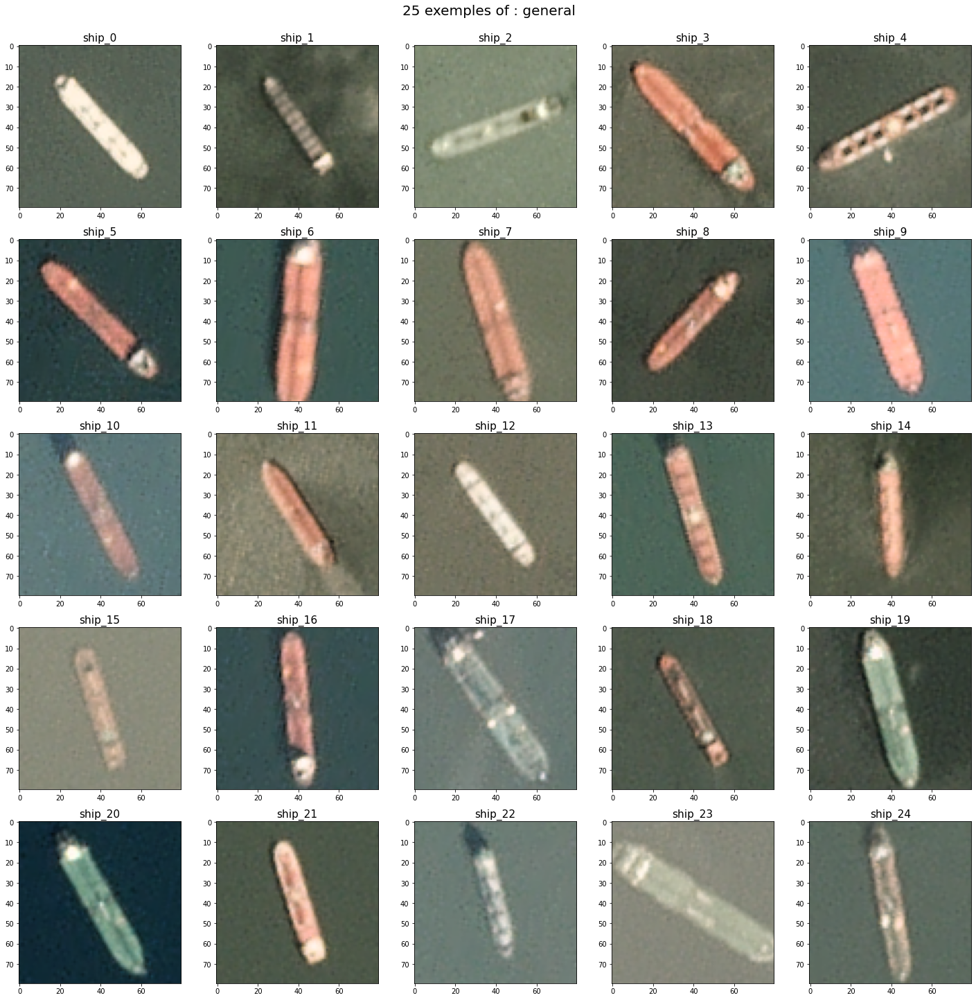

In [18]:
show_examples(classes= classes,
              images= df['data'], #X
              labels= df['labels'], #y
              set_name= 'general')

* * #### Ship images shuffled

In [19]:
df_ship = shuffle(df[df.labels == 1]).reset_index(drop=True)

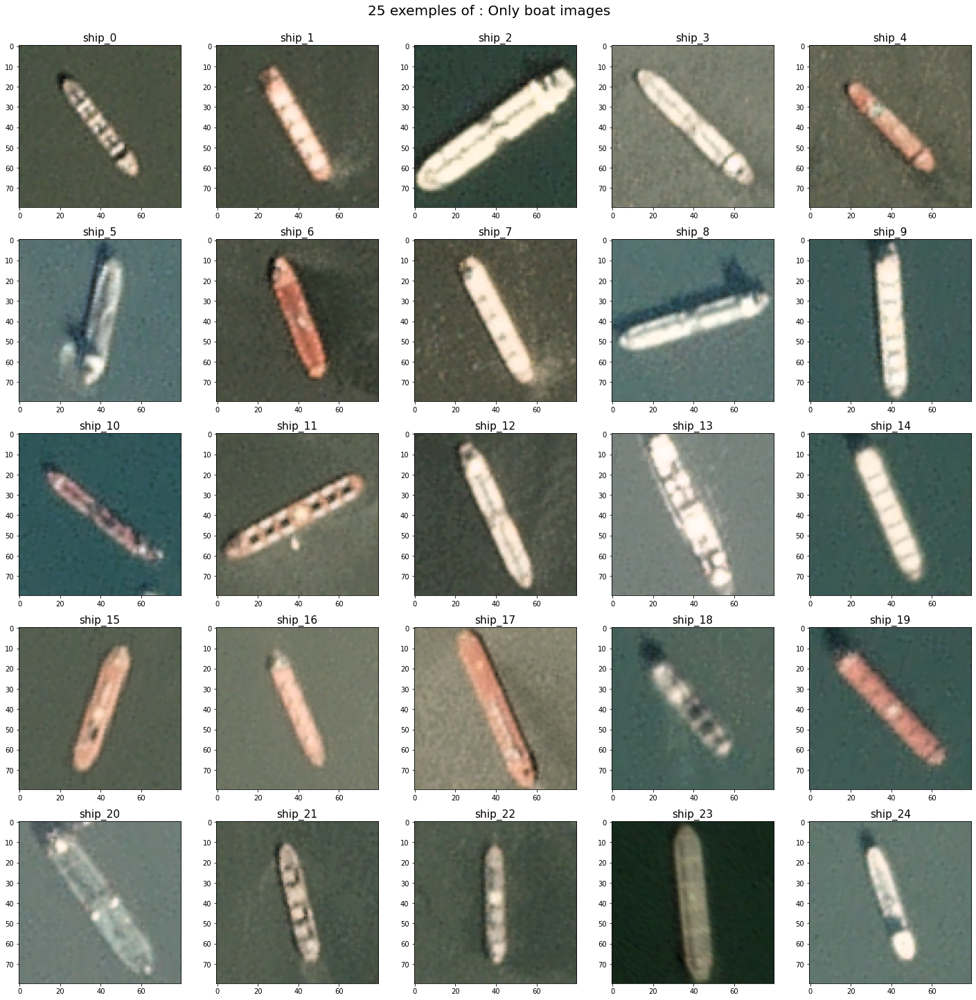

In [20]:
show_examples(classes= classes, 
              images= df_ship['data'],
              labels= df_ship['labels'],
              set_name='Only boat images')

* * #### Not ship images shuffled

In [21]:
df_non_ship = shuffle(df[df.labels == 0]).reset_index(drop=True)

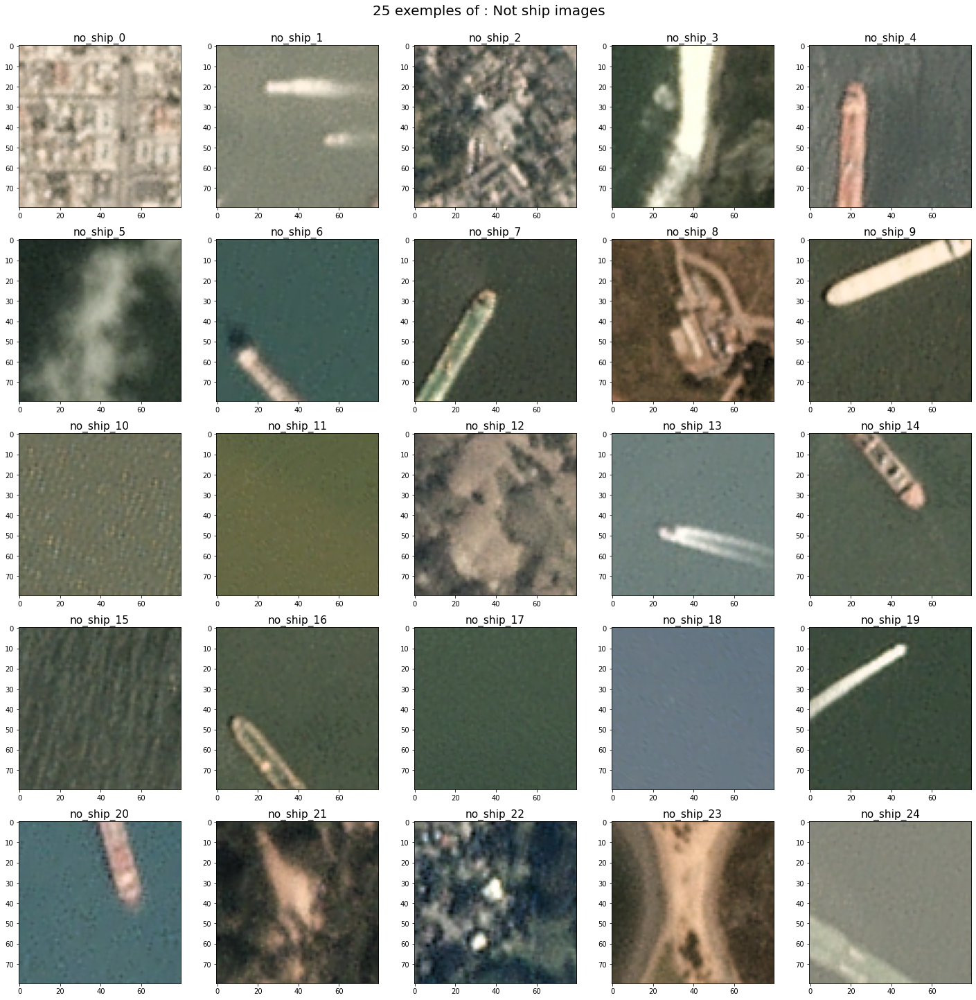

In [22]:
show_examples(classes= classes,
              images= df_non_ship['data'],
              labels= df_non_ship['labels'],
              set_name= 'Not ship images')

We can notice something about the not ship labeled images :
* They can show the background(sea,forest,a piece of the harbor)
* They can show a __partial ships__ ! 

Two potentially major problems here : 
* A piece of the harbor as a __dike__ or a __bridge__ may __look like ships__
* A __piece of ship__ may have the __same patterns__ as a __complete ships__

This two points can mislead our futur models !
We will check this when our models are implemented

# Explore the entire dataset

* ### Verify that there's a split point in the dataset, according to labels

Above we saw different categories : boat, landscape, partial ships.

Maybe there's other types of images, we will explore portion by portion our images to see if we missed something earlier

Verify that every label is the same as the precedent except two (split point and the first image)

In [23]:
df[df.labels != df.shift(1).labels].index

Int64Index([0, 1000], dtype='int64')

In [24]:
df.iloc[:2]

,data,labels
0,"[[[82, 94, 80], [89, 99, 86], [91, 101, 89], [...",1
1,"[[[76, 86, 70], [75, 85, 70], [67, 77, 64], [6...",1


In [25]:
df.iloc[999:1001]

,data,labels
999,"[[[113, 114, 96], [114, 113, 95], [112, 111, 9...",1
1000,"[[[73, 104, 100], [75, 105, 102], [75, 105, 10...",0


The split point is at idx __1000__

This fact can let us think that the images aren't shuffled

* ### Explore Ship labeled

There's only 1000 images labeled as ships.

We will visualize 20 random images from every 333 images to see if there's special images labeled as ship

In [26]:
df_ship = df[df.labels == 1]

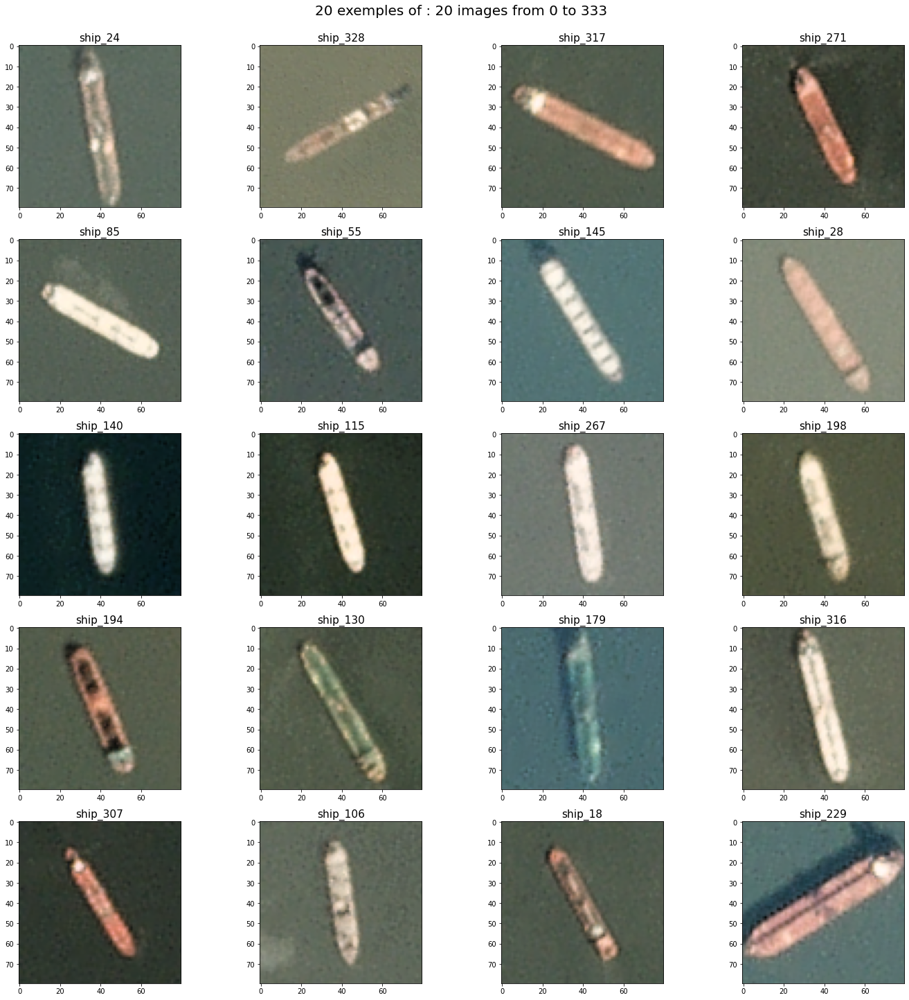

Press ENTER to continue and SPACE to stop ...


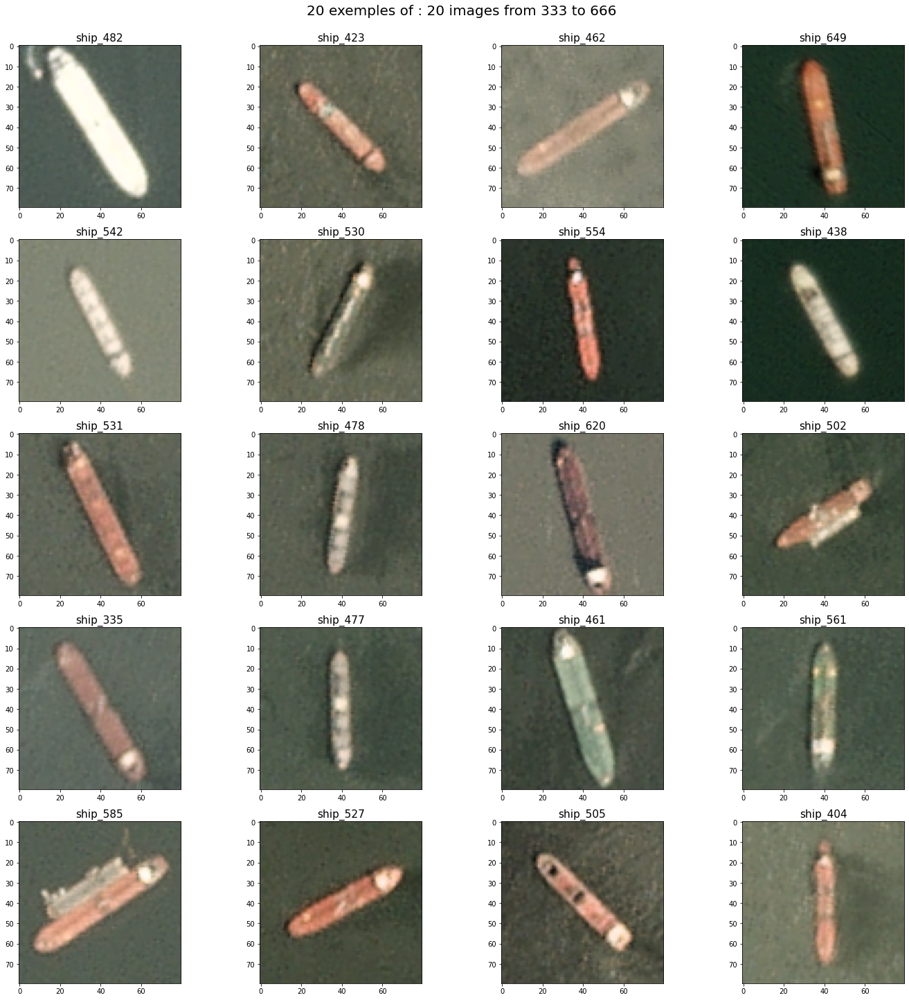

Press ENTER to continue and SPACE to stop ...


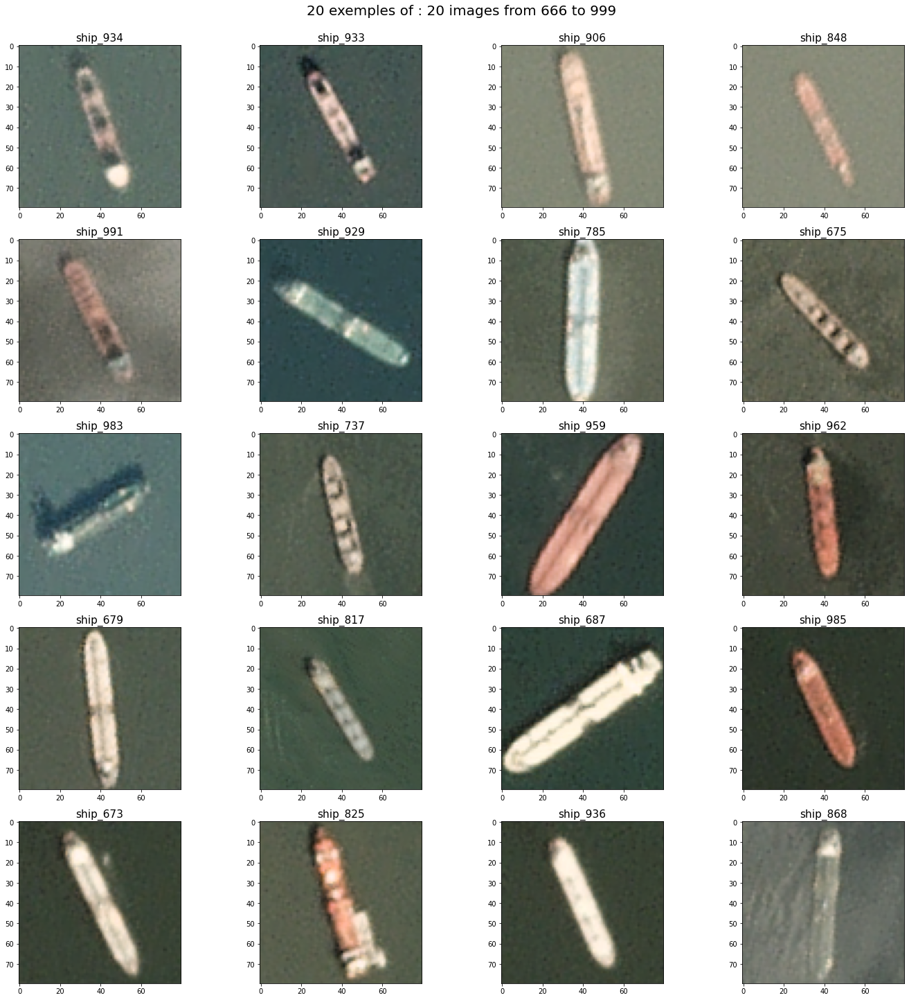

Press ENTER to continue and SPACE to stop ...
END OF THE LOOP


In [27]:
plot_images_by_batches(df_ship,3,20)

There's nothing to notice here, all the images labeled as ships are actually ships

* ### Explore No-Ship labeled

There's 3000 No-ship labeled images, we will first explore each third of the data set

In [28]:
df_non_ship = df[df.labels == 0].reset_index(drop=True)

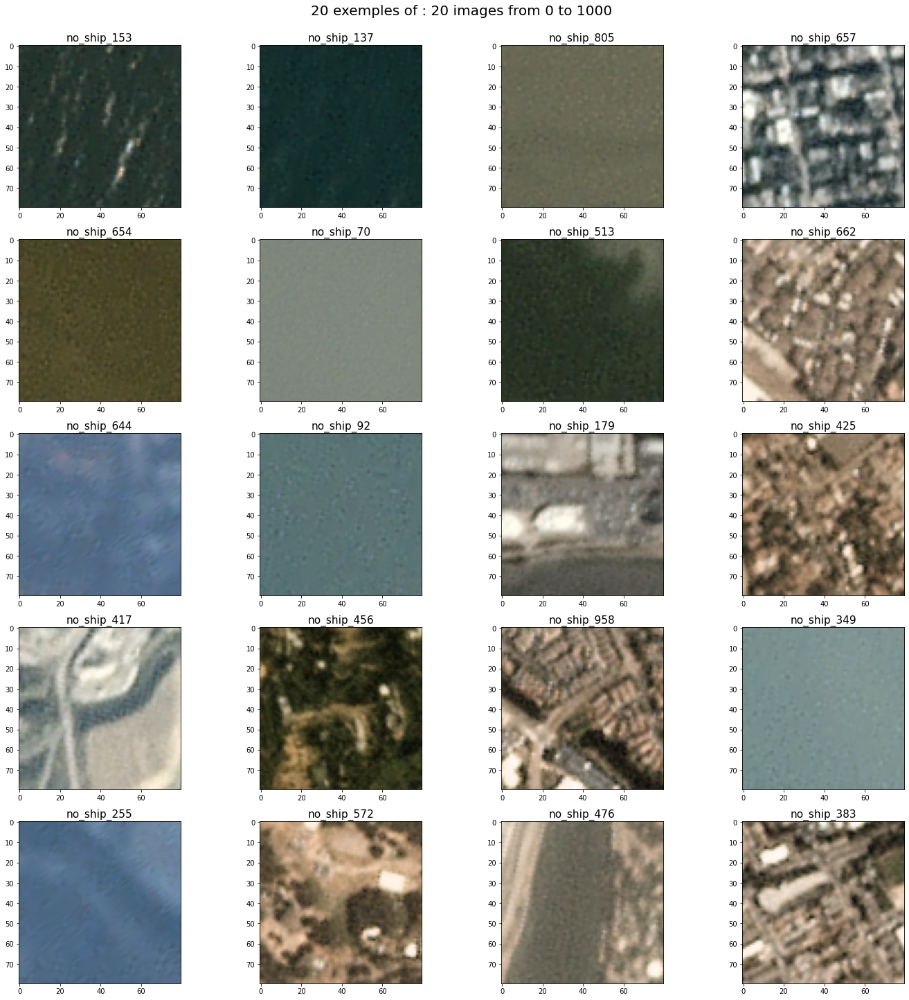

Press ENTER to continue and SPACE to stop ...


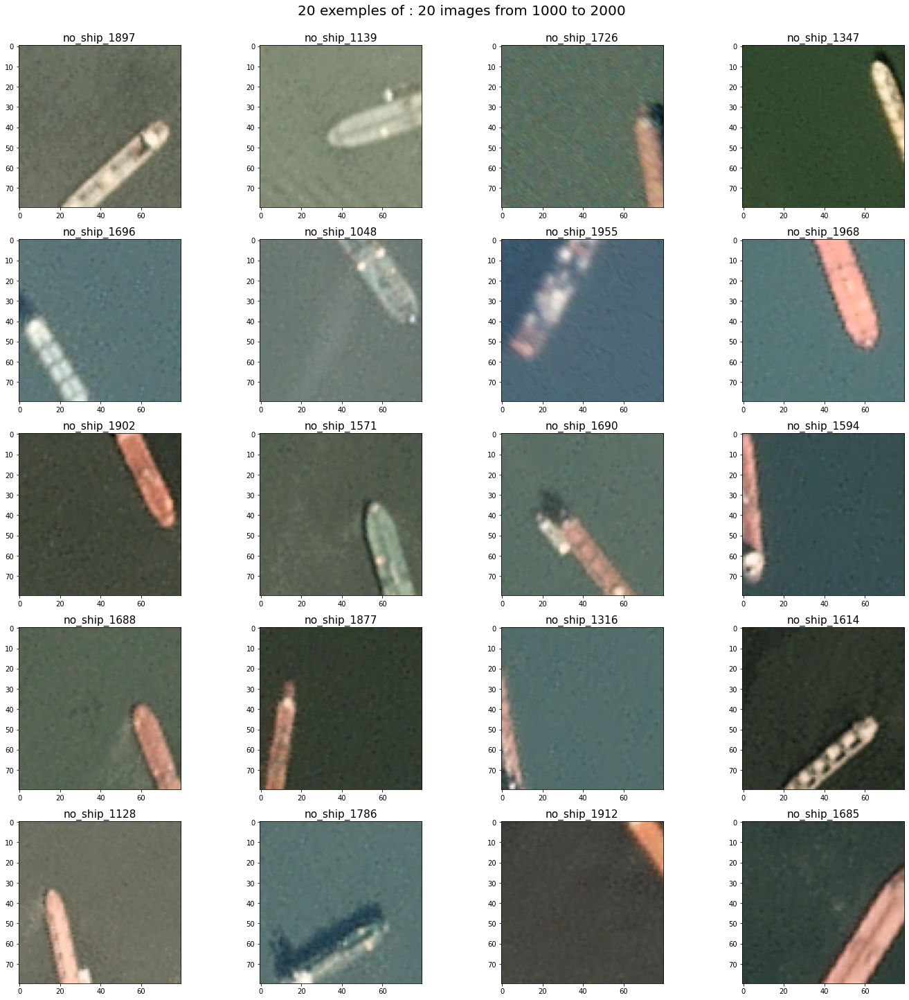

Press ENTER to continue and SPACE to stop ...


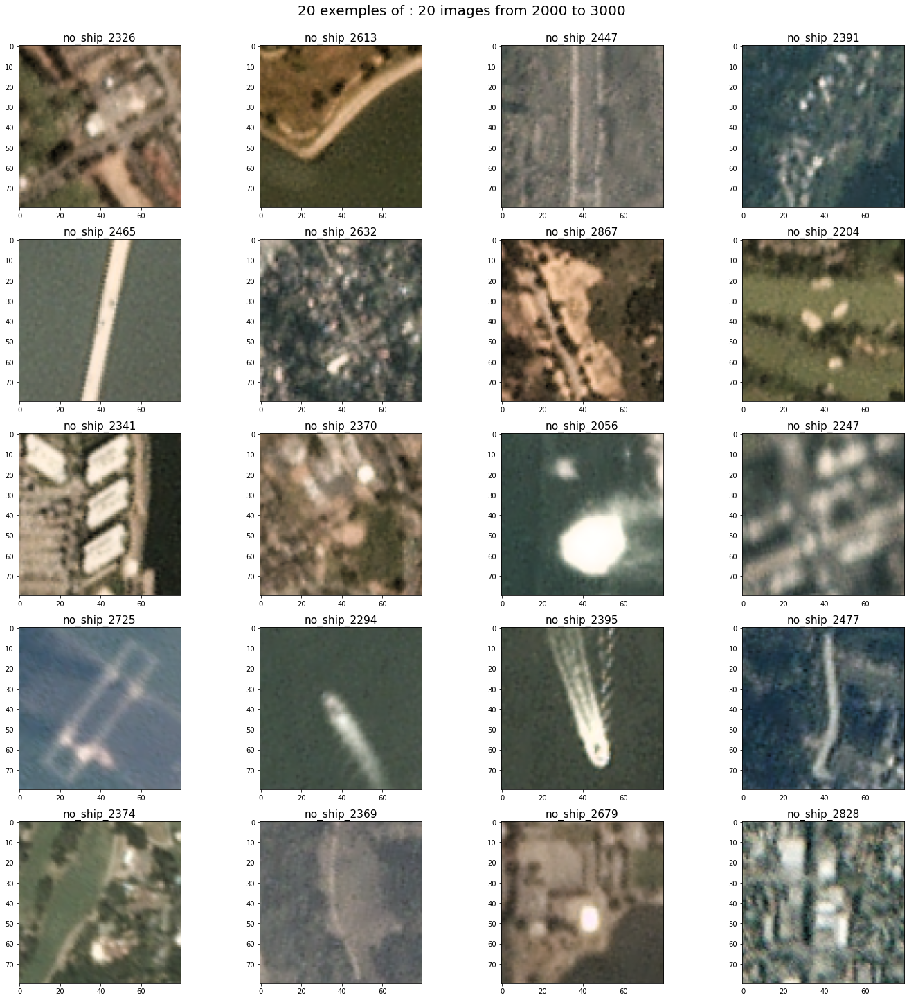

Press ENTER to continue and SPACE to stop ...
END OF THE LOOP


In [29]:
plot_images_by_batches(df_non_ship,3,20)

By launching the cell above a couple of times, we noticed very quickly that there's a pattern in the distribution of the images.

The first third show landscapes.

The second third show :
* Small parts of ships
* Long parts of ships that can be considered as ships
* Full ships

The last third are actually random images from landscapes to boats moving, but we can see that some of the images ressemble strangely to ships as dikes

To be sure we will focus on the last third of the dataset

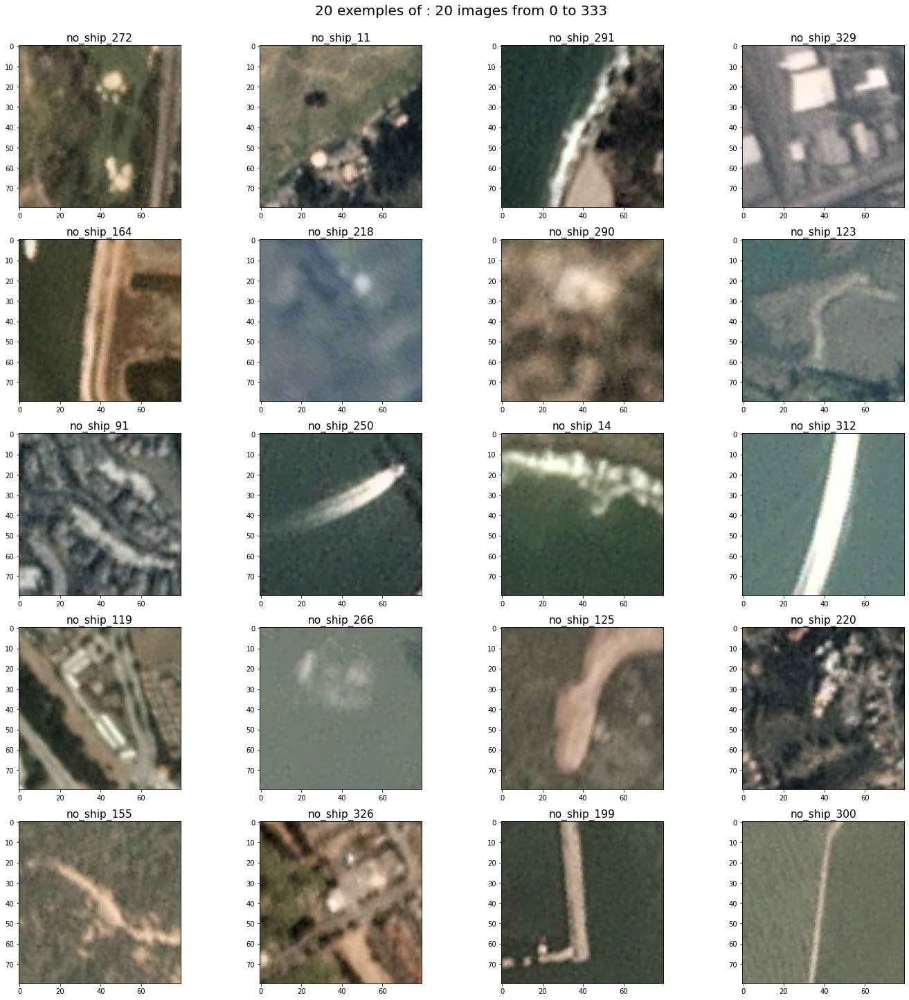

Press ENTER to continue and SPACE to stop ...


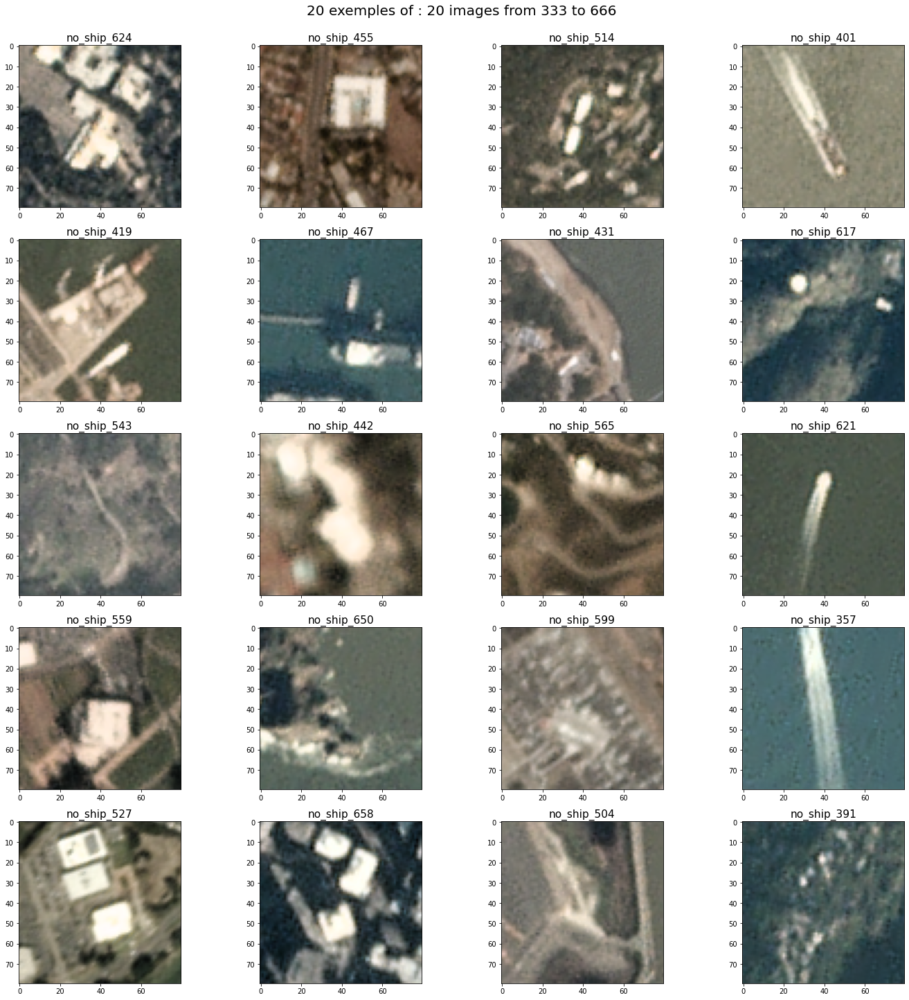

Press ENTER to continue and SPACE to stop ...


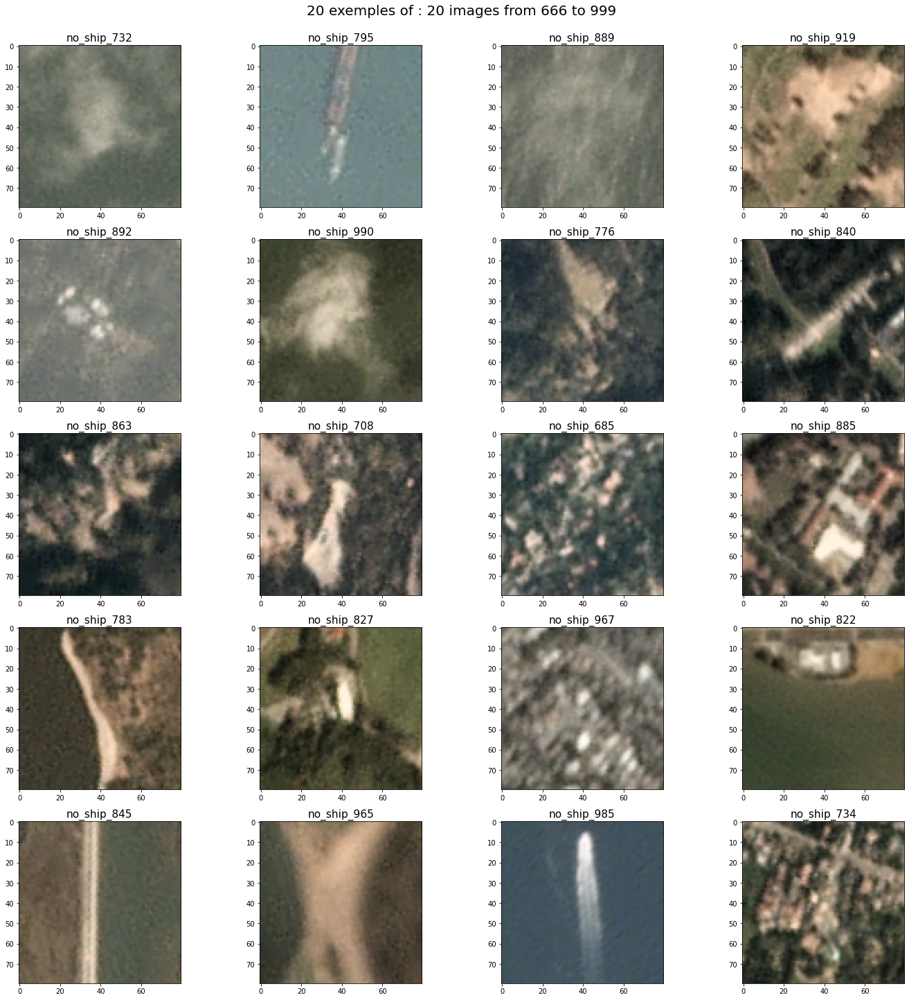

Press ENTER to continue and SPACE to stop ...
END OF THE LOOP


In [30]:
df_non_ship = df_non_ship.iloc[-1000:].reset_index(drop=True)
plot_images_by_batches(df_non_ship,3,20)

There's misleading images in this portion, but also ships (picture took from very high altitude) that are misclassified as not ship.

We will get more information about our dataset with deeper exploration.

We will proceed to deeper EDA after DL modelingi if needed.